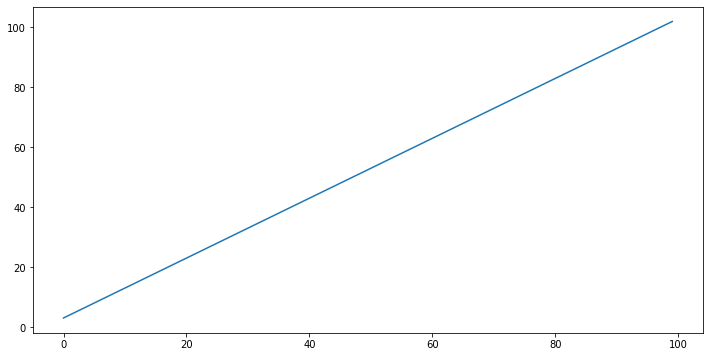

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

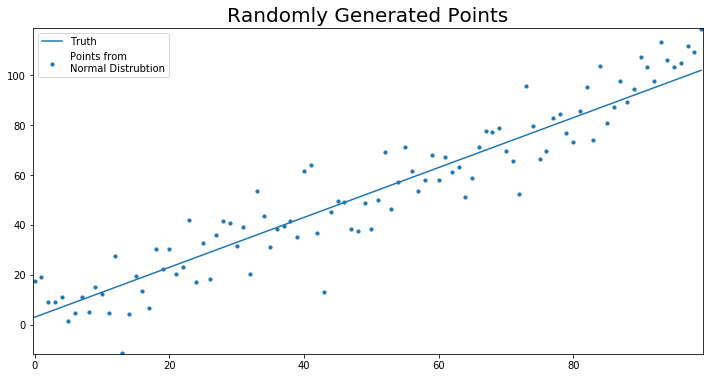

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

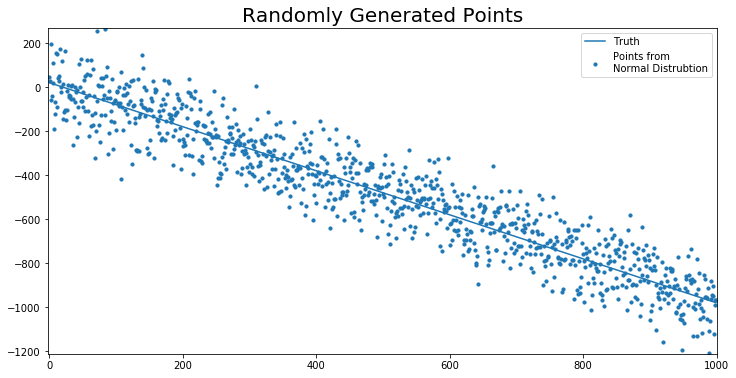

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

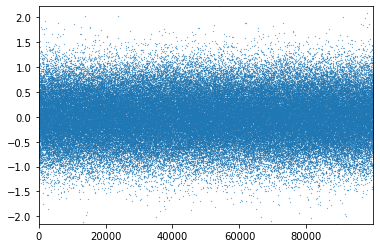

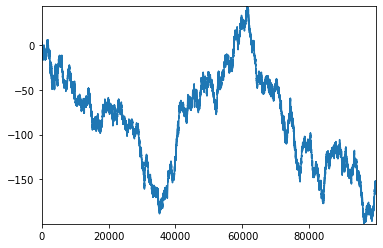

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)


In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-1.257647,3.090737,-0.733693,-0.405817,1.665176,1.419087,-0.555802,1.162048,-0.310301,-1.216507,...,1.916397,-0.636248,0.836237,0.045824,0.564414,1.762054,-0.539596,-0.698556,0.423625,0.069739
1,-0.348414,-1.193541,-0.552077,-0.076242,1.271134,-0.327807,-0.974206,0.679276,-0.856080,-0.203661,...,-2.172534,-0.493353,1.242330,0.719942,-0.430308,-1.048659,0.370842,-0.172810,-0.325846,-0.608654
2,-1.467742,-1.371725,0.540861,1.141666,2.117359,0.416369,-0.669425,-0.994549,-0.384521,2.448713,...,-0.049079,1.648191,0.408878,1.752476,-0.246103,2.035600,-1.548477,-0.819990,-0.495852,-1.430425
3,0.113983,-2.946563,-0.722275,-1.055571,-0.252191,-1.055911,1.036809,-0.063195,0.740643,-0.176982,...,-2.311463,-0.064759,1.423568,0.052929,0.263572,-0.214253,-0.540792,0.065789,0.510994,-1.909124
4,0.099515,-1.640670,1.219027,0.110611,-0.988421,0.764316,0.508998,0.289762,-0.239050,0.991301,...,-0.503275,-0.188024,0.126708,0.853487,-0.110381,1.528406,-0.581321,-0.987008,1.839934,-0.072337
5,1.167084,0.802066,-0.552337,0.407665,0.392590,1.309432,-0.102271,0.326215,-0.143784,-0.479691,...,-1.975750,-1.244253,1.064853,0.636707,2.073655,-0.180693,0.030708,0.098388,0.427146,-0.439200
6,1.332997,-0.319971,-1.085831,-0.417768,0.210537,0.188638,1.047669,1.035945,0.450729,-0.225702,...,-0.401282,0.278615,-1.146237,-0.913117,-1.201754,-1.062494,-0.492719,-0.885362,2.027442,0.716206
7,-1.786415,-1.012327,-1.112120,0.217404,-0.487402,1.510093,0.472126,0.444920,0.851944,0.175185,...,1.453761,-0.859362,-0.218661,-0.574596,0.790389,-0.364921,0.505477,1.092389,0.917445,1.274297
8,0.665205,-1.089056,-2.139899,-0.213969,-0.411633,-0.308914,0.061395,1.113110,1.664220,-0.126935,...,1.673834,0.316930,0.696511,-1.165678,0.240813,0.378383,-0.601481,-0.458937,2.220865,-0.128205
9,-0.341610,1.250400,-1.433394,-1.223143,0.868506,-1.047497,0.876157,1.553567,-0.487661,1.117867,...,-0.733521,0.054806,-1.609588,-0.333612,0.853001,0.716079,-1.535642,0.059020,-0.104025,-0.265743


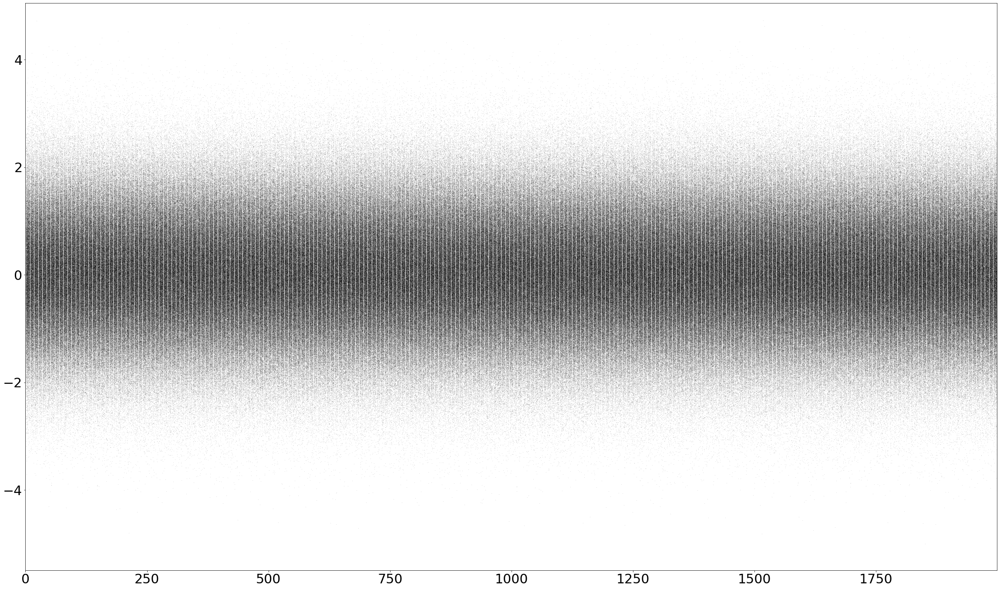

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

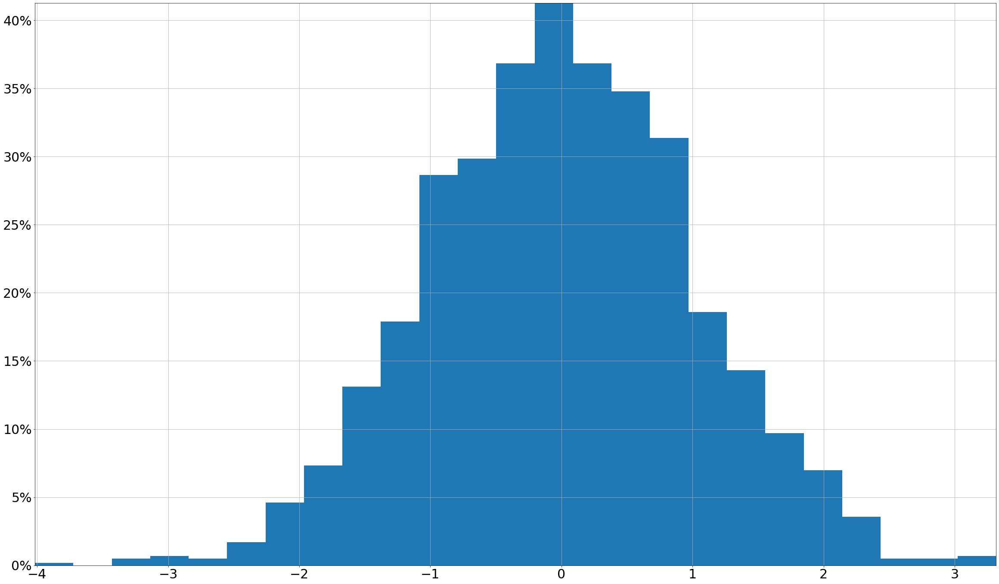

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.254917,0.788444,-1.424632,0.195922,0.255648,-0.438911,-0.433918,0.481246,0.521083,0.613717,...,0.182469,-0.249019,0.110482,-0.033651,0.647573,-0.210855,0.288318,-0.097574,0.576153,0.181659
1,-1.117412,1.298191,-1.321248,-0.226157,0.326433,0.319153,-0.486281,0.656960,0.732848,0.770018,...,1.071898,-0.874364,0.570378,-0.884733,0.289565,-0.182442,1.072386,-0.425065,1.205491,0.331194
2,-1.208916,2.130381,-0.997536,-0.308983,0.371589,0.680829,-0.347042,0.113518,0.352925,0.835178,...,0.640939,-0.503498,1.043707,-0.691832,0.022971,0.379487,0.020504,-0.764494,0.435758,-0.521147
3,-0.969749,2.591397,-1.892076,0.984808,0.807551,0.351332,0.362072,0.130057,-0.764726,1.304027,...,0.624110,-0.782486,1.422292,0.046594,-0.096427,0.193694,-1.350215,-1.423533,0.378937,0.197934
4,-1.235345,3.268547,-0.671396,1.085008,0.773670,0.900791,0.269784,-0.202488,-1.067059,0.290196,...,0.058017,-0.025663,2.144133,-0.384315,0.107120,0.108039,-1.130535,-1.265371,0.071162,1.328605
5,-0.486628,3.253747,-0.152971,1.677043,1.427489,0.898028,0.079840,-0.089269,-0.832667,0.773015,...,0.348599,-0.066056,2.050738,0.468387,-0.527244,0.312374,-1.606893,-1.532991,0.167812,1.137755
6,-0.967636,3.327175,-0.389159,2.177578,-0.024292,0.988773,-0.273862,0.109901,-0.913747,1.379757,...,0.381500,0.561217,2.156323,0.447414,-0.688925,0.448881,-1.002142,-0.882993,0.164308,1.019243
7,-0.942734,2.798524,-0.385004,1.967613,-0.998904,1.602525,-0.374131,-0.802078,-1.578055,2.143355,...,1.494094,0.521639,2.501585,1.069252,-1.151879,0.888842,-1.657102,-1.229027,0.187883,1.425447
8,-0.364650,2.999642,0.560117,1.650090,-1.188175,1.391933,-0.336364,-0.320309,-1.588501,2.111200,...,1.488683,0.727350,3.023765,1.239800,-1.483751,1.004569,-1.473216,-0.950398,0.165804,1.314745
9,0.340306,2.614444,0.160501,2.385548,-0.912342,1.279855,-0.517174,-0.289403,-1.985532,2.887518,...,1.405668,1.552113,3.747368,1.569063,-1.259636,0.796789,-1.555441,-0.156469,0.494760,1.430929


In [10]:
def plot_monte_carlo_sim(sim_data,  title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    sim_data["mean"].plot.line(legend = False, color = "C3", linewidth = 5, logy = logy, ax = ax)
    index = list(sim_data.index) 
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

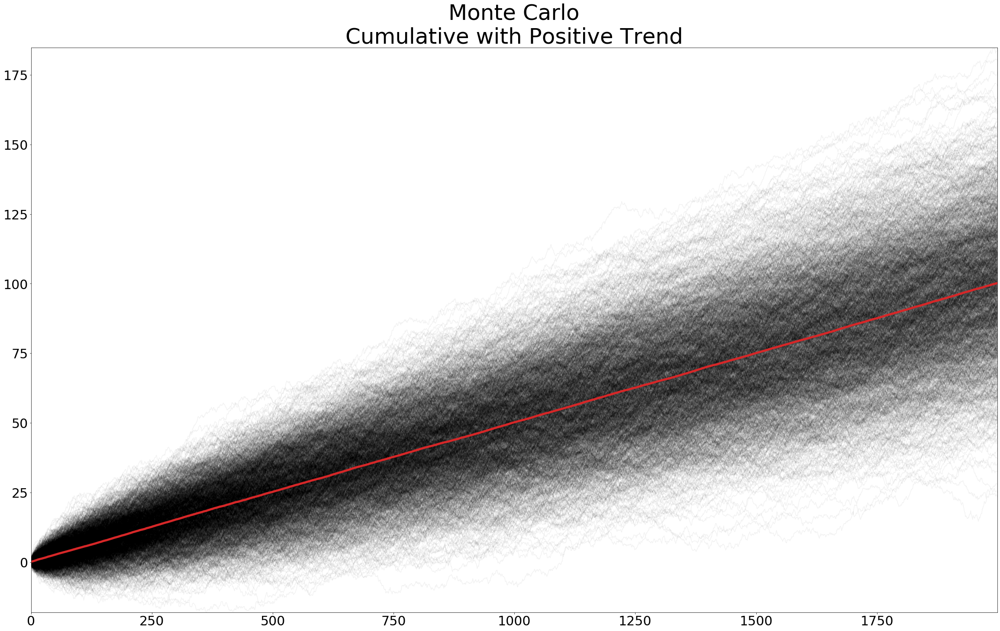

In [11]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
    title = "Monte Carlo\nCumulative with Positive Trend", logy = False)


### Calculating Expected Value

In [12]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0         0.055077
1         0.118514
2         0.179489
3         0.224386
4         0.274648
5         0.329679
6         0.372531
7         0.433211
8         0.488324
9         0.547087
10        0.594247
11        0.648706
12        0.733872
13        0.802293
14        0.852575
15        0.900426
16        0.943330
17        1.002228
18        1.052468
19        1.113697
20        1.150765
21        1.178066
22        1.214773
23        1.274470
24        1.327558
25        1.379042
26        1.408713
27        1.469521
28        1.511361
29        1.546667
           ...    
1970     98.726410
1971     98.772272
1972     98.831146
1973     98.890341
1974     98.951108
1975     99.002464
1976     99.054901
1977     99.120280
1978     99.172941
1979     99.205905
1980     99.243627
1981     99.289547
1982     99.351969
1983     99.387334
1984     99.449322
1985     99.507111
1986     99.564151
1987     99.631926
1988     99.685211
1989     99.738721
1990     99.776108
1991     99.

### Simulating Changes in Portfolio Values

In [13]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)

# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [14]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072812,-0.004366,0.028109
2005-01-10,0.004874,-0.004188,-0.001044,0.006242
2005-01-11,-0.002612,-0.063805,-0.007107,-0.007792
2005-01-12,0.001871,0.013941,0.002211,0.009507
2005-01-13,-0.019044,0.066300,-0.007982,-0.000256


In [15]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094170,0.979847,0.956292
2005-01-10,1.002244,1.089588,0.978824,0.962261
2005-01-11,0.999626,1.020066,0.971867,0.954763
2005-01-12,1.001496,1.034287,0.974015,0.963840
2005-01-13,0.982423,1.102860,0.966240,0.963593


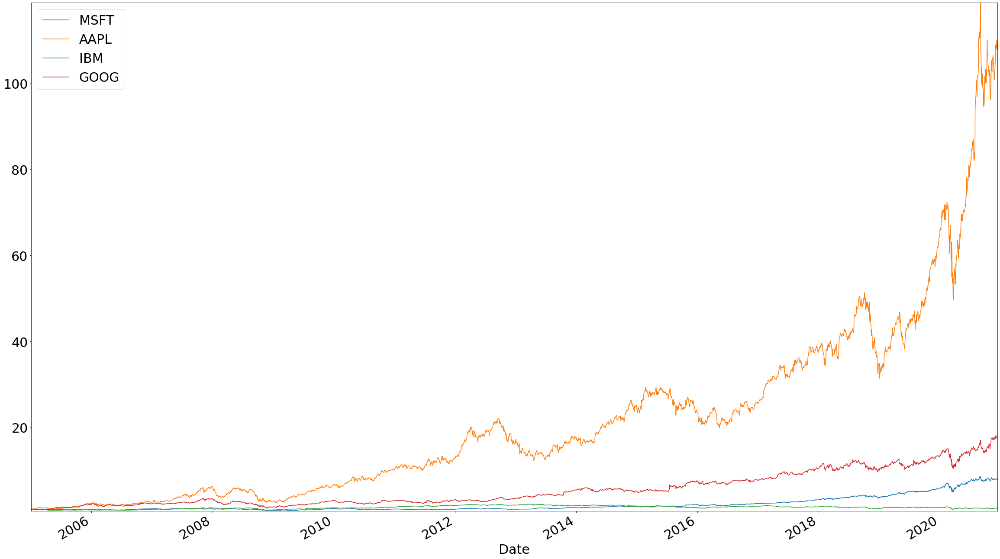

In [16]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [17]:
mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000517,0.017284
AAPL,0.001168,0.021036
IBM,0.000060,0.014579
GOOG,0.000715,0.018819


In [18]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [19]:
monte_carlo_sim_dfs

{'MSFT':                   0          1         2         3          4         5    \
 2005-01-03   0.997475   1.005985  0.993289  1.004859   1.015108  0.996501   
 2005-01-04   0.995760   0.999181  0.997073  1.014022   1.033362  1.007068   
 2005-01-05   0.988751   1.008542  0.973708  1.015141   1.062296  1.015826   
 2005-01-06   0.975504   0.995034  0.984223  1.011036   1.052334  1.004931   
 2005-01-07   0.980510   0.961131  0.989397  0.974922   1.082204  0.986904   
 2005-01-10   1.009706   0.954276  0.997342  0.949414   1.060229  0.972200   
 2005-01-11   1.019546   0.954187  1.020428  0.952892   1.085129  0.995146   
 2005-01-12   1.019054   0.950024  1.039614  0.942177   1.086933  1.013514   
 2005-01-13   1.021402   0.958841  1.042250  0.930979   1.009344  0.997504   
 2005-01-14   1.021747   0.970532  1.035719  0.900134   1.014931  0.991916   
 2005-01-18   1.049692   0.960564  1.055979  0.905935   1.009923  1.010430   
 2005-01-19   1.035542   0.946513  1.021116  0.932019   

In [23]:
def plot_monte_carlo_sim(sim_data, observed_data = None, title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, color = "C2", linewidth = 5, logy = logy, ax = ax)
    
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C2")
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [24]:
monte_carlo_sim_dfs[stock].median(axis = 1)

2005-01-03    1.000942
2005-01-04    1.002961
2005-01-05    1.002733
2005-01-06    1.001388
2005-01-07    1.002914
2005-01-10    1.003512
2005-01-11    1.004639
2005-01-12    1.005336
2005-01-13    1.002669
2005-01-14    1.002931
2005-01-18    1.004666
2005-01-19    1.001821
2005-01-20    1.003040
2005-01-21    1.002483
2005-01-24    1.002304
2005-01-25    1.004997
2005-01-26    1.004042
2005-01-27    1.006728
2005-01-28    1.009387
2005-01-31    1.009732
2005-02-01    1.010229
2005-02-02    1.011460
2005-02-03    1.011468
2005-02-04    1.011754
2005-02-07    1.011653
2005-02-08    1.009326
2005-02-09    1.012809
2005-02-10    1.015146
2005-02-11    1.016764
2005-02-14    1.014581
                ...   
2020-10-30    4.024891
2020-11-02    4.079700
2020-11-03    4.066713
2020-11-04    4.133518
2020-11-05    4.077296
2020-11-06    4.068576
2020-11-09    4.046343
2020-11-10    4.070875
2020-11-11    4.050764
2020-11-12    4.066863
2020-11-13    4.045288
2020-11-16    4.047187
2020-11-17 

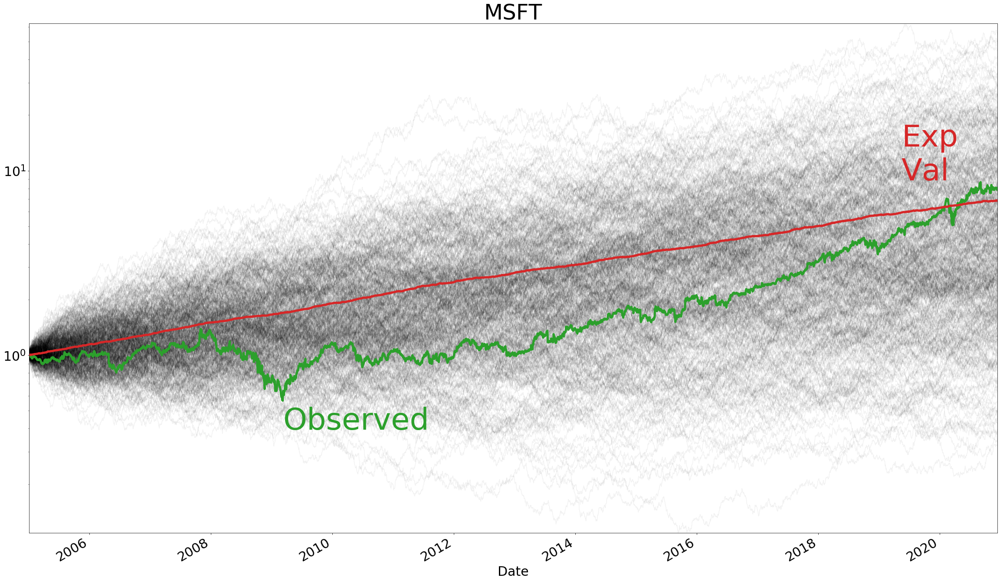

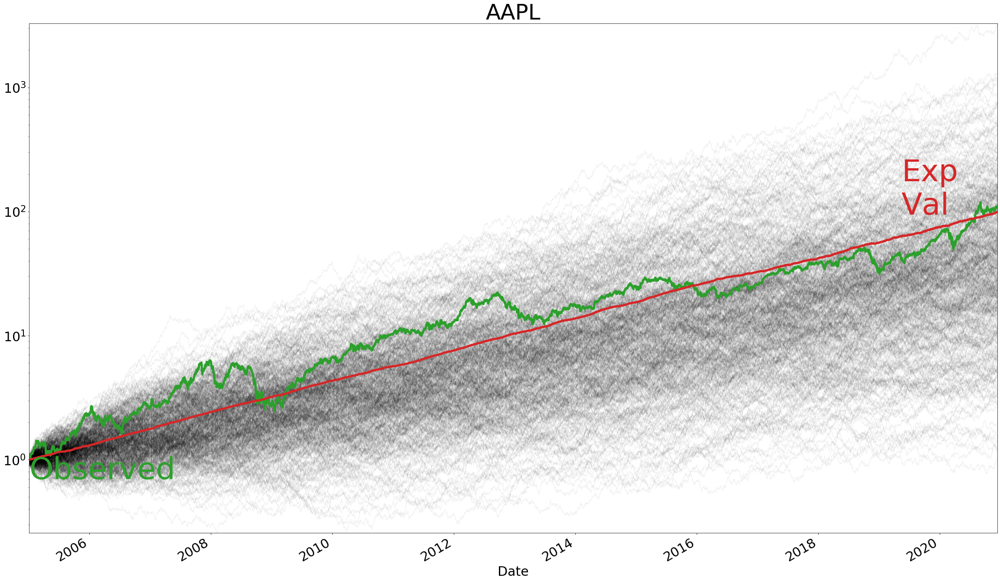

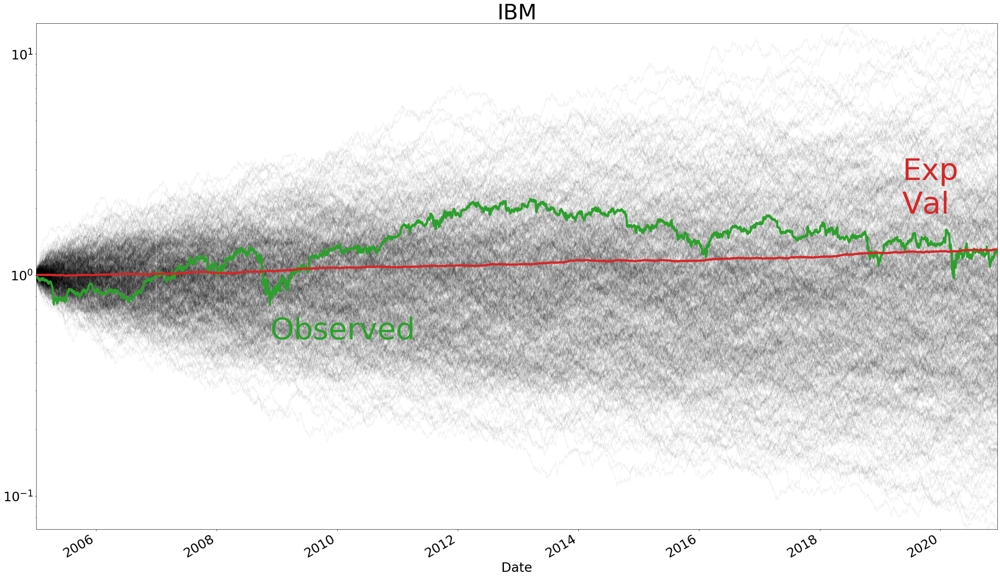

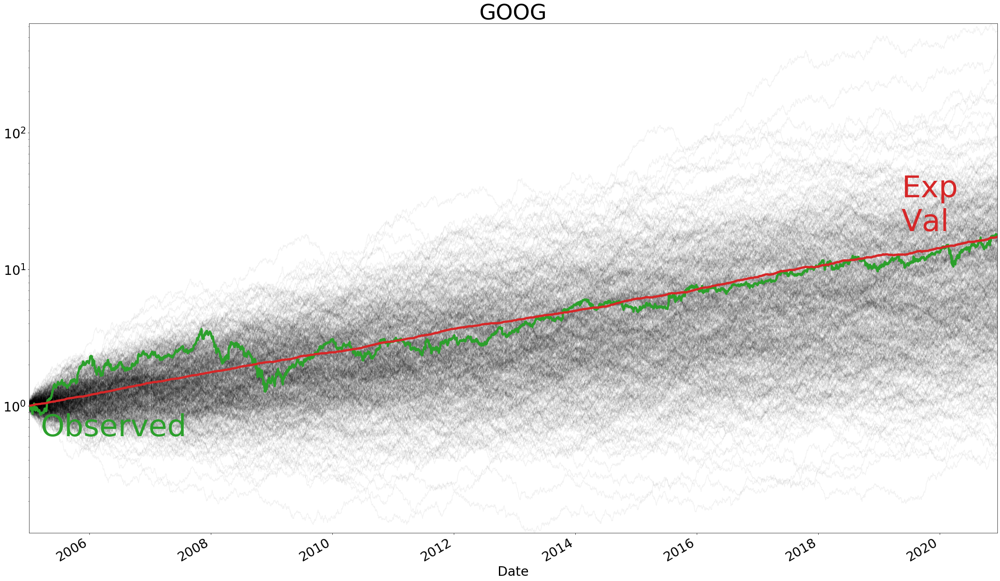

In [25]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], close_data_normalized[stock], stock, logy= True)


## Calculate Portfolio Return

In [26]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [27]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]), axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094170,0.979847,0.956292,1.006923
2005-01-10,1.002244,1.089588,0.978824,0.962261,1.008229
2005-01-11,0.999626,1.020066,0.971867,0.954763,0.986581
2005-01-12,1.001496,1.034287,0.974015,0.963840,0.993409
2005-01-13,0.982423,1.102860,0.966240,0.963593,1.003779


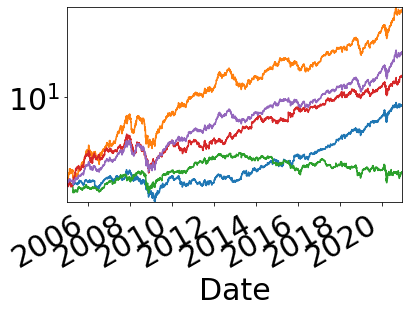

In [28]:
close_data_normalized.plot.line(legend=False, logy = True)

In [29]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001297
2005-01-11,-0.021472
2005-01-12,0.006922
2005-01-13,0.010439
2005-01-14,0.004986


In [30]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) **(1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000877,0.0166


In [31]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, dates)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,1.014804,1.002836,0.999420,1.008569,0.989203,0.985597,0.980632,1.012556,0.975691,1.018554,...,1.028600,1.007619,1.022898,0.966411,0.999038,0.999304,0.996454,0.990817,1.006886,0.962902
2005-01-04,1.022572,1.001984,1.010505,1.044307,1.008454,0.970259,0.994578,1.016096,0.982924,1.029933,...,1.048635,1.014586,1.039492,0.975008,1.008629,0.983075,0.987358,0.992378,1.008932,0.948677
2005-01-05,1.044387,1.000834,1.055469,1.040567,1.011044,0.987982,0.977643,1.004790,1.011640,1.043619,...,1.064353,1.017382,1.049145,0.975954,1.003221,0.986385,0.966976,1.026439,1.008958,0.939370
2005-01-06,1.070421,0.988774,1.045959,1.042282,1.016045,0.964527,0.980410,0.985058,1.033693,1.028518,...,1.071866,0.992139,1.061101,0.986007,1.007564,0.987617,0.968091,1.008247,1.000174,0.951617
2005-01-07,1.061927,0.976761,1.048738,1.031813,1.022250,0.967287,1.008096,0.962491,1.018152,1.002970,...,1.070877,0.990434,1.045423,1.008304,1.021042,0.991977,0.983630,0.997719,1.008579,1.002289
2005-01-10,1.034594,0.970067,1.051511,1.011882,1.027712,0.979811,0.981675,0.956808,1.019257,0.996904,...,1.089712,0.980552,1.028243,1.016137,1.022825,0.994606,1.015054,1.007786,1.010284,1.025329
2005-01-11,1.022271,0.942406,1.049682,1.044703,1.048723,0.953956,0.973430,0.956549,1.047310,0.994674,...,1.071661,0.982869,1.031367,1.000972,1.003303,1.019391,0.985974,1.020765,0.992390,1.051271
2005-01-12,1.056966,0.912682,1.057082,1.050743,1.030670,0.941385,0.991006,0.982059,1.026401,1.026330,...,1.078745,0.992540,1.051294,0.989725,0.988480,1.017070,0.984894,1.015715,0.988176,1.069433
2005-01-13,1.081036,0.913103,1.071775,1.036785,1.042212,0.930756,0.999546,0.978933,1.058858,1.041138,...,1.082695,0.994936,1.039809,0.990224,0.989044,1.005952,0.949809,1.017658,1.002225,1.090118
2005-01-14,1.089004,0.911408,1.068548,1.045803,1.059063,0.903267,0.989719,0.967833,1.088133,1.012128,...,1.084425,1.003679,1.067075,0.997922,0.983119,0.999339,0.938479,1.028521,1.016255,1.084364


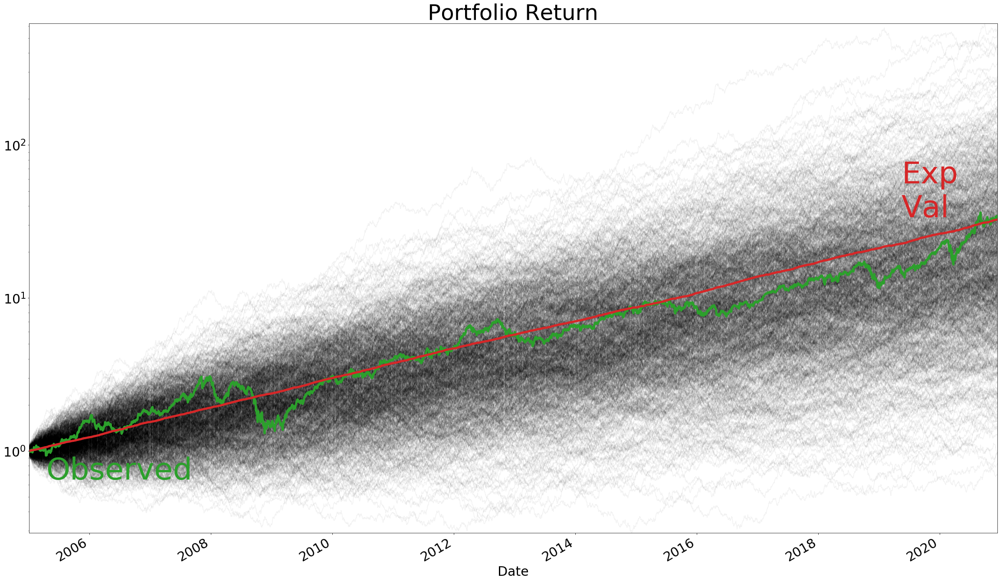

In [32]:
plot_monte_carlo_sim(monte_carlo_sim_df, ex_return["Portfolio Return"], "Portfolio Return", logy= True)